![](https://i.imgur.com/N0zUCi0.png)

# 🔬 Multimodal Research and Report Generation Pipeline

## 📋 Project Overview

This project demonstrates advanced multimodal AI capabilities by building an end-to-end research pipeline using **Google Gemini**. The pipeline ingests diverse data formats—PDFs, images, and videos—and automatically generates comprehensive, academically-structured research reports with proper citations.

The project explores **two distinct architectural approaches** for multimodal analysis, comparing their strengths, tradeoffs, and use cases in real-world applications.

---

## 🎯 Objectives

- **Multimodal Data Integration**: Process and analyze text documents, architectural diagrams, and video presentations simultaneously
- **Cross-Modal Reasoning**: Enable the AI to identify relationships and insights across different data formats
- **Automated Report Generation**: Produce professional research reports (1500-2000 words) with academic citations
- **Architectural Comparison**: Evaluate single-pass vs. two-phase processing approaches

---

## 🏗️ Architecture Approaches

### Approach 1: Single-Step Multimodal Analysis
**Strategy**: All resources encoded and processed in one unified API call  
**Advantage**: Holistic cross-modal reasoning, single API call efficiency  
**Best For**: When cross-modal relationships are critical and all resources fit within context window  

### Approach 2: Two-Phase Sequential Analysis  
**Strategy**: Individual resource analysis → text aggregation → final synthesis  
**Advantage**: Modality-specific optimization, incremental processing, token efficiency  
**Best For**: Large files, when specialized analysis per modality is needed, or for modular workflows  

---

## 🛠️ Technical Stack

- **LLM**: Google Gemini 3.0 Flash (multimodal capabilities)
- **Framework**: LangChain (message handling and prompt orchestration)
- **Data Processing**: Python (base64 encoding, MIME type detection)

---

## 📊 Pipeline Workflow

1. **Resource Preparation**: Automatic MIME type detection and base64 encoding
2. **Prompt Engineering**: Structured instructions for academic report generation
3. **Multimodal Processing**: AI analyzes text, visuals, and video content
4. **Citation Integration**: Automatic source attribution with numbered references
5. **Report Synthesis**: Generation of cohesive, professionally-formatted output

---

## 💡 Key Features

✅ **Automatic File Processing**: Utility function handles any file type  
✅ **Academic Citations**: Wikipedia/research paper style references [1][2][3]  
✅ **Unified Narrative**: No explicit source-type mentions in final report  
✅ **Conflict Resolution**: AI reconciles contradictions across sources  
✅ **Comparative Analysis**: Side-by-side evaluation of both approaches  

---

## 🎓 Learning Outcomes

By completing this project, you will understand:
- How to build production-ready multimodal AI pipelines
- The tradeoffs between different architectural patterns for LLM applications
- Best practices for prompt engineering in multimodal contexts
- Techniques for generating structured, citation-backed AI outputs

---

**Let's begin building!** 🚀

### Installation

We start by installing all necessary libraries.
These include LangChain, Google Generative AI SDKs, and supporting utilities.

In [ ]:
!pip install -q langchain==1.2.8
!pip install -q langchain-community==0.4.1
!pip install -q langchain-google-genai==4.2.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 64.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 60.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.7/64.7 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.0/51.0 kB 4.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.32.4, but you have requests 2.32.5 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 kB 6.2 MB/s eta 0:00:00


### Import Dependencies

In [ ]:
# Required imports
import os
import base64
from getpass import getpass
from langchain_google_genai import ChatGoogleGenerativeAI
from langchain.messages import HumanMessage
from IPython.display import Markdown

### Securely Set the Google API Key

For security,  avoid hardcoding the API key.
If the key is not already set, the user is prompted to enter it securely.

In [ ]:
# Set API Key securely
os.environ["GOOGLE_API_KEY"] = getpass("Enter your Google API key: ")

Enter your Google API key: ··········


## Download Research Resources

We use `gdown` to pull the research resource data into the local environment.


- Two PNG images

- One PDF specification document

- One explanatory video

These assets will later be uploaded to Gemini for multimodal reasoning.

The overall idea is that we do some general research, find out resources, download them and leverage LLMs to help understand these resource and then build a report.

In [ ]:
!gdown 13mtmuBLPwvELY-mPkOIpHj2V6effGYbu

Downloading...
From: https://drive.google.com/uc?id=13mtmuBLPwvELY-mPkOIpHj2V6effGYbu
To: /content/MCP_resources.zip
100% 13.8M/13.8M [00:00<00:00, 46.0MB/s]


In [ ]:
!unzip -o MCP_resources.zip

Archive:  MCP_resources.zip
  inflating: MCP_image2.png          
  inflating: Anthropics MCP_ A Breakthrough in AI Integration.mp4  
  inflating: MCP_image1.png          
  inflating: mcp_document.pdf        


### Preview the Multimodal Data

Before analysis, you can preview the data manually by downloading files from the Colab workspace OR viewing them directly in the notebook as shown below.

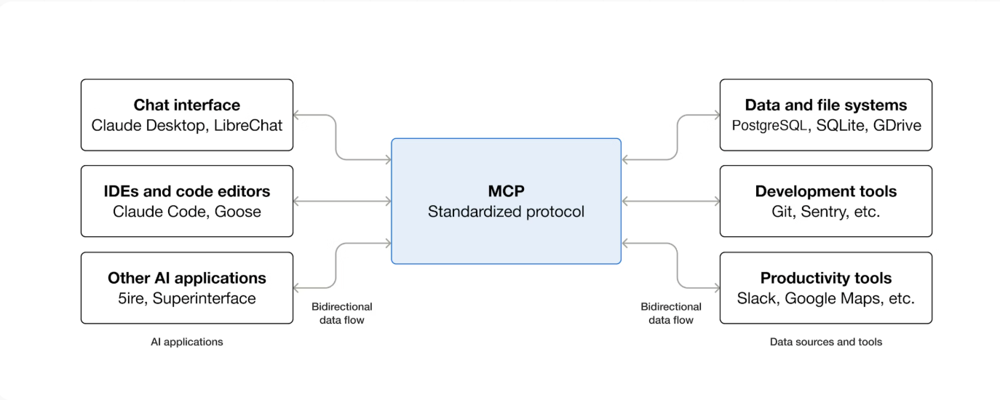

In [ ]:
from IPython.display import Image as ImageDisp, display

display(ImageDisp('MCP_image1.png'))

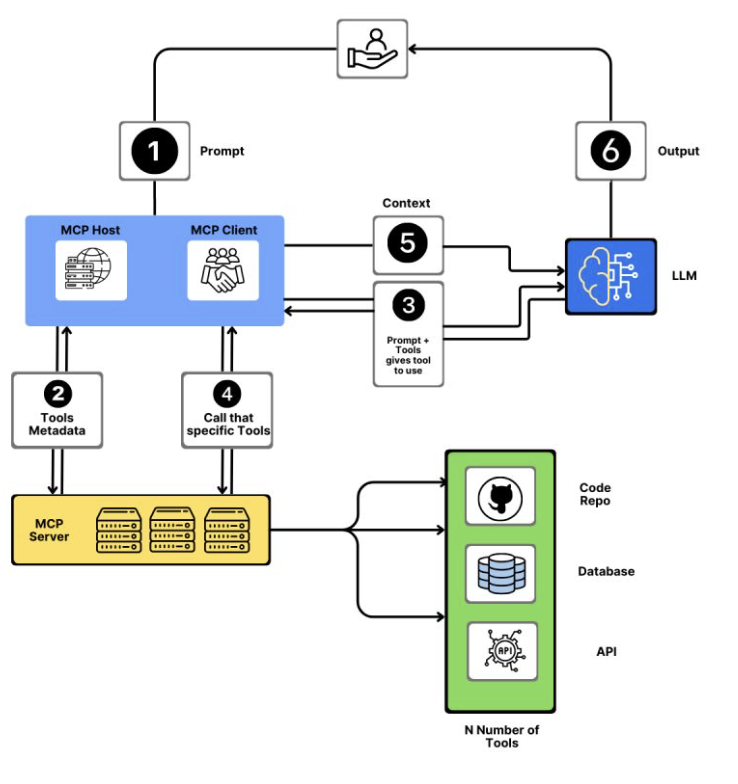

In [ ]:
from IPython.display import Image as ImageDisp, display

display(ImageDisp("MCP_image2.png"))

In [ ]:
from IPython.display import Markdown, Video

Video('Anthropics MCP_ A Breakthrough in AI Integration.mp4', embed=True, width=450)

## File Processing Utility for Multimodal Prompting

### Overview

This utility function simplifies the process of preparing local files for use with Multimodal LLMs like Google's Generative AI models (like Gemini). It automatically detects the file type and converts it to the base64-encoded format required by the LangChain Google GenAI integration.

#### Function: `process_local_file(file_path: str) -> dict`

#### Purpose
Converts any local file (images, videos, audio, PDFs, etc.) into the standardized format needed for `HumanMessage` content blocks when working with `ChatGoogleGenerativeAI`.

#### What it does:
1. **Validates** the file exists at the given path
2. **Detects** the MIME type automatically using Python's `mimetypes` module
3. **Reads and encodes** the file content as base64
4. **Categorizes** the content type as:
   - `"image"` for image files (JPEG, PNG, GIF, etc.)
   - `"video"` for video files (MP4, AVI, MOV, etc.)
   - `"audio"` for audio files (MP3, WAV, etc.)
   - `"file"` for documents (PDF, TXT, etc.)

### Returns
A dictionary ready to be inserted into a `HumanMessage` content list:

```python
{
    "type": "image" | "video" | "audio" | "file",
    "base64": "<base64-encoded-content>",
    "mime_type": "image/jpeg" | "video/mp4" | etc.
}
```

### Usage Example

```python
from langchain.messages import HumanMessage
from langchain_google_genai import ChatGoogleGenerativeAI

# Initialize model
model = ChatGoogleGenerativeAI(model="gemini-3-pro-preview")

# Process your local file
file_content = process_local_file("path/to/your/image.jpg")

# Create message with the processed file
message = HumanMessage(
    content=[
        {"type": "text", "text": "What's in this image?"},
        file_content  # Insert the processed file directly
    ]
)

# Get response
response = model.invoke([message])
```

### Benefits
- **No manual encoding**: Automatically handles base64 conversion
- **Type detection**: No need to manually specify MIME types or content types
- **Error handling**: Validates file existence and MIME type detection
- **Clean code**: One-liner to process any file type
- **Reusable**: Works with images, videos, audio, PDFs, and more

### Error Handling
- Raises `FileNotFoundError` if the file doesn't exist
- Raises `ValueError` if the MIME type cannot be determined


In [ ]:
import base64
import mimetypes
from pathlib import Path


def process_local_file(file_path: str) -> dict:
    """
    Process a local file and return it in the format required for Google Generative AI.

    Args:
        file_path (str): Path to the local file

    Returns:
        dict: A dictionary containing:
            - type: The content type ('image', 'video', 'audio', or 'file')
            - base64: Base64 encoded file content
            - mime_type: MIME type of the file

    Raises:
        FileNotFoundError: If the file doesn't exist
        ValueError: If the MIME type cannot be determined
    """
    # Verify file exists
    path = Path(file_path)
    if not path.exists():
        raise FileNotFoundError(f"File not found: {file_path}")

    # Determine MIME type
    mime_type = mimetypes.guess_type(file_path)[0]
    if mime_type is None:
        raise ValueError(f"Could not determine MIME type for: {file_path}")

    # Read and encode file
    with open(file_path, "rb") as file:
        file_bytes = file.read()
        file_base64 = base64.b64encode(file_bytes).decode("utf-8")

    # Determine content type based on MIME type
    if mime_type.startswith("image/"):
        content_type = "image"
    elif mime_type.startswith("video/"):
        content_type = "video"
    elif mime_type.startswith("audio/"):
        content_type = "audio"
    else:
        # Default to "file" for PDFs and other documents
        content_type = "file"

    return {
        "type": content_type,
        "base64": file_base64,
        "mime_type": mime_type
    }

## Initialize the Gemini Model


In [ ]:
llm = ChatGoogleGenerativeAI(
    model="gemini-3-flash-preview",
    temperature=0
)


## Approach 1: Single-Step Multimodal Analysis and Report Generation

### Overview

This approach leverages the native multimodal capabilities of Google's Gemini models to process and analyze multiple data formats simultaneously in a single API call. By encoding all source materials (text, images, PDFs, videos) into a unified prompt, the model can perform cross-modal reasoning and generate a cohesive research report that synthesizes insights from all modalities at once.



![](https://i.imgur.com/Itezl0t.png)

### Methodology

#### Step 1: Multimodal Resource Preparation
All research materials are processed using the `process_local_file()` utility function, which:
- Automatically detects MIME types for each file
- Reads and encodes file contents as base64
- Categorizes content type (image, video, file, audio)
- Returns standardized dictionaries ready for LLM consumption

#### Step 2: Unified Prompt Construction
A single `HumanMessage` object is constructed containing:
- **System Instructions**: Detailed guidelines for report structure, citation style, and academic tone
- **Multimodal Resources**: All encoded materials (images, PDFs, videos) embedded directly in the content array
- **Research Directives**: Specific sections to address and analytical framework to follow

#### Step 3: Single-Pass Generation
The model processes all inputs simultaneously, enabling:
- **Cross-modal reasoning**: The model can reference relationships between visual diagrams, textual documentation, and video demonstrations
- **Unified synthesis**: Information from different sources is integrated naturally without segmentation
- **Contextual citations**: Claims are supported with numbered references to specific source materials

### Key Advantages

✅ **Holistic Understanding**: The model sees all context at once, enabling deeper cross-modal insights  
✅ **Efficiency**: Single API call reduces latency and simplifies the pipeline  
✅ **Natural Integration**: The model naturally synthesizes information without artificial boundaries  
✅ **Citation Accuracy**: Direct access to all sources enables precise attribution  

### Trade-offs

⚠️ **Context Window Constraints**: Large files (especially videos) may approach token limits  
⚠️ **Processing Complexity**: The model must manage multiple modalities simultaneously  
⚠️ **Less Granular Control**: Cannot fine-tune analysis strategies per resource type  

### Expected Output

A comprehensive research report (1500-2000 words) with:
- Executive summary and introduction
- Technical architecture and operational workflow analysis
- Ecosystem integration and capabilities assessment
- Critical evaluation of strengths and limitations
- Academic-style numbered citations [1], [2], [3], [4]
- Professional, unified narrative voice

---



**Implementation begins below** ↓

In [ ]:
image1_content = process_local_file("MCP_image1.png")
{
    k: v[:100] for k, v in image1_content.items()
}

{'type': 'image',
 'base64': 'iVBORw0KGgoAAAANSUhEUgAABV4AAAImCAYAAACra5GpAAAMTmlDQ1BJQ0MgUHJvZmlsZQAASImVVwdYU8kWnltSSQgQiICU0Jsg',
 'mime_type': 'image/png'}

In [ ]:
image1_content = process_local_file("MCP_image1.png")
image2_content = process_local_file("MCP_image2.png")
pdf_content = process_local_file("mcp_document.pdf")
video_content = process_local_file("Anthropics MCP_ A Breakthrough in AI Integration.mp4")

research_content = [
    image1_content,
    image2_content,
    pdf_content,
    video_content,
]

TOPIC = "Model Context Protocol (MCP)"

In [ ]:
prompt = HumanMessage(
    content=[
        {
            "type": "text",
            "text": f"""
You are a research analyst writing a comprehensive technical research report on {TOPIC}

You have been provided with multiple source materials about a system or technology. Your task is to synthesize all the information into a single, cohesive research report that reads as a unified document—not as separate analyses of different sources.

**Critical Instructions:**

1. **Unified Voice**: Write the report as if all information comes from a single, authoritative understanding. Do NOT explicitly reference source types (e.g., "the PDF states...", "Image 1 shows...", "the video demonstrates...").

2. **Citation Style**: When making specific claims, use numbered citations in brackets [1], [2], [3], [4] corresponding to available media resources provided to you.
For example:
   - [1] Technical documentation (PDF1)
   - [2] Image (Image2)
   - [4] Video (Video1)
   and so on

3. **Synthesis Over Segmentation**: Integrate information from all sources naturally. If multiple sources support the same point, cite all relevant sources [1][2].

4. **Resolve Conflicts**: If sources present conflicting information, reconcile the differences in your narrative or present the most authoritative version without explicitly stating "Source X contradicts Source Y."

5. **Professional Academic Tone**: Write as you would for a peer-reviewed technical publication or industry research report.

**Report Structure:**

1. **Executive Summary**
   Provide a concise overview of the system, its purpose, and key findings (150-200 words).

2. **Introduction**
   Introduce the system or technology, the problem it addresses, and its significance in the current landscape.

3. **Technical Architecture**
   Describe the system's architecture, core components, design principles, and operational flow. Integrate insights from diagrams and technical specifications seamlessly.

4. **Operational Workflow**
   Explain how the system functions in practice, including key processes, interactions, and data flows.

5. **Ecosystem and Interoperability**
   Discuss how the system integrates with other tools, platforms, and data sources.

6. **Capabilities and Features**
   Highlight key functionalities, use cases, and demonstrated applications.

7. **Analysis and Evaluation**
   Assess strengths, limitations, scalability considerations, security implications, and potential challenges.

8. **Conclusions**
   Synthesize findings into a concise conclusion about the system's impact and future potential.

9. **References**
   List the source materials:
   - [1] Technical documentation (PDF1)
   - [2] Image (Image2)
   - [4] Video (Video1)

**Writing Guidelines:**
- Use clear, precise technical language
- Maintain objectivity and analytical rigor
- Integrate cross-modal insights naturally without calling attention to the source format
- Ensure smooth transitions between sections
- Support claims with citations but let the narrative flow naturally
- Aim for approximately 1500-2000 words

Begin your research report below:
"""
        },
        *research_content  # Unpacks all the processed file contents
    ]
)


response = llm.invoke([prompt])

Display the report in Markdown

In [ ]:
display(Markdown(response.text))

**Technical Research Report: The Model Context Protocol (MCP)**

### **1. Executive Summary**
The Model Context Protocol (MCP) is an open-standard communication framework designed to revolutionize the integration between Large Language Models (LLMs) and external data ecosystems. Launched by Anthropic in November 2024, MCP addresses the persistent challenge of fragmentation in AI development, where connecting models to diverse data sources traditionally required bespoke, non-transferable integrations [3][4]. By establishing a standardized, bidirectional interface, MCP functions as a universal connector—analogous to a "USB-C port" for AI applications—enabling models to seamlessly and securely access documents, databases, and web-based tools [1][3]. 

The architecture is built on a robust client-server model, separating the AI host environment from the data-providing servers. This decoupling allows developers to build a single MCP server that can interface with any compatible AI client, significantly reducing development overhead and enhancing scalability [3]. Key findings indicate that MCP not only streamlines the retrieval of real-time context but also empowers LLMs to perform complex actions through a structured capability exchange. As the industry moves toward more autonomous and agentic AI systems, MCP provides the foundational infrastructure necessary for secure, interoperable, and context-aware machine intelligence [4].

---

### **2. Introduction**
In the current landscape of artificial intelligence, Large Language Models (LLMs) possess immense reasoning capabilities but are often constrained by "contextual isolation." While models like Claude or GPT-4 can process vast amounts of information, their ability to interact with a user’s private data—such as local files, proprietary databases, or real-time API feeds—has historically been hindered by the need for custom-coded connectors [3][4]. This fragmentation creates significant bottlenecks, forcing developers to reinvent integration logic for every new tool or data repository.

The Model Context Protocol (MCP) was introduced to solve this interoperability crisis. By providing a set of universal rules for how models access and utilize context, MCP allows for a structured, secure, and scalable way to bridge the gap between reasoning engines and data sources [3]. Its significance lies in its ability to transform AI from a passive text generator into an active participant in a developer’s or enterprise’s workflow, capable of querying databases, monitoring software performance, and managing productivity tools through a single, unified standard [1][3].

---

### **3. Technical Architecture**
The MCP architecture is defined by a three-tier structure that ensures a clean separation of concerns between the user interface, the protocol management, and the data source.

#### **3.1 Core Components**
The system is comprised of three primary entities:
*   **The Host**: This is the primary AI application or environment where the user interacts with the model. Examples include the Claude Desktop app, IDEs like Cursor or Claude Code, and other specialized AI interfaces [1][3]. The host provides the environment for the AI and facilitates access to tools.
*   **The Client**: Operating within the host, the MCP client acts as the communication manager. It maintains the connection to various MCP servers and handles the routing of requests and data [3].
*   **The Server**: These are lightweight programs that expose specific capabilities to the client. A server can be local (accessing a user’s filesystem) or remote (interfacing with web APIs like GitHub or Slack) [3].

#### **3.2 Design Principles**
MCP is built on the principle of a standardized protocol that governs the "rules" of engagement between the model and the context [3]. This standardization ensures that any MCP-compliant server can talk to any MCP-compliant client without manual reconfiguration. The architecture supports bidirectional data flow, allowing the model to not only pull information but also receive notifications and updates from the server [1][3].

#### **3.3 The "USB-C" Analogy**
The protocol is frequently compared to the USB-C standard in hardware [3][4]. Just as a single USB-C port allows a computer to connect to a variety of peripherals (monitors, keyboards, storage) regardless of the manufacturer, MCP allows an AI application to connect to a diverse range of data sources (PostgreSQL, Google Drive, Sentry) through a universal interface [1][3].

---

### **4. Operational Workflow**
The functioning of MCP follows a structured sequence of interactions that ensures the model receives the exact context required to fulfill a user request.

#### **4.1 Capability Exchange**
Before data is exchanged, the client and server perform a "handshake" known as a capability exchange [3]. 
1.  **Initial Request**: The client sends a request to the server to identify its available capabilities.
2.  **Server Response**: The server responds with a manifest of what it can provide, such as specific tools, resource types, or prompt templates.
3.  **Confirmation**: Once the connection is established and capabilities are mapped, the system is ready for message exchange [3].

#### **4.2 The Execution Loop**
When a user provides a prompt, the system follows a six-step operational flow [2]:
1.  **Prompt Submission**: The user provides a prompt to the MCP Host.
2.  **Metadata Retrieval**: The Host/Client queries the MCP Server for tool metadata to determine which external resources are relevant to the prompt.
3.  **Tool Selection**: The model analyzes the prompt and the available tools, deciding which specific tool to invoke.
4.  **Tool Call**: The MCP Client executes a call to the specific tool hosted on the MCP Server.
5.  **Context Integration**: The server retrieves the data (from a database, API, or file) and sends it back as "Context" to the LLM.
6.  **Output Generation**: The LLM processes the original prompt alongside the newly acquired context to produce a final, informed output for the user [2].

---

### **5. Ecosystem and Interoperability**
The strength of MCP lies in its broad ecosystem, which spans across various categories of software and data management.

#### **5.1 AI Applications (Clients)**
MCP is currently integrated into several high-profile AI environments, including:
*   **Chat Interfaces**: Claude Desktop and LibreChat.
*   **Development Environments**: Claude Code, Goose, and Cursor.
*   **Specialized Platforms**: 5ire and Superinterface [1][3].

#### **5.2 Data Sources and Tools (Servers)**
The protocol supports a wide array of data sources, categorized into:
*   **Data and File Systems**: PostgreSQL, SQLite, and Google Drive.
*   **Development Tools**: Git, GitHub, and Sentry for error tracking.
*   **Productivity and Communication**: Slack, Gmail, and Google Maps [1][3].

This interoperability ensures that a developer can write a single MCP server for a proprietary database, and that database immediately becomes accessible to any AI tool that supports the protocol [3].

---

### **6. Capabilities and Features**
MCP servers expose three main types of capabilities to LLMs, allowing for a rich, multi-functional interaction [3]:

*   **Resources**: These are data-centric exposures. They allow the model to read content from the server, such as local files, API responses, or database records. This provides the "knowledge" the model needs for a specific task.
*   **Tools**: These enable the LLM to perform actions. Unlike resources, which are typically read-only, tools allow the model to interact with the world—for example, creating a GitHub issue, sending a Slack message, or executing a database query.
*   **Prompts**: Servers can provide reusable prompt templates. These help standardize workflows by giving the model specific instructions on how to handle certain types of data or tasks [3].

Additionally, the protocol supports **Sampling**, which allows the server to request completions from the LLM, and **Notifications**, which enable real-time updates between the client and server [3].

---

### **7. Analysis and Evaluation**
#### **7.1 Strengths**
*   **Standardization**: By eliminating the need for custom connectors, MCP significantly lowers the barrier to entry for AI integration.
*   **Security**: The client-server model allows for granular control. Servers can run locally on a user's machine, ensuring that sensitive data never leaves the local environment unless explicitly intended [3].
*   **Efficiency**: The capability exchange ensures that the model only interacts with relevant tools, reducing token waste and improving response latency.

#### **7.2 Scalability and Challenges**
MCP is highly scalable because it moves the burden of integration from the model provider to the tool provider. However, the success of the protocol depends on widespread adoption. While it is an open standard, its current momentum is heavily driven by the Anthropic ecosystem. For it to become a true industry-wide "USB-C," other major LLM providers must adopt the standard to prevent new forms of "protocol silos" [4].

#### **7.3 Security Implications**
Because MCP allows models to execute tools and access files, security is paramount. The protocol's architecture supports transport layers that can be secured via standard encryption and authentication methods, but implementers must ensure that the "Host" environment maintains strict permissions over what the "Client" is allowed to request from the "Server" [3].

---

### **8. Conclusions**
The Model Context Protocol represents a significant milestone in the evolution of artificial intelligence. By standardizing the way models interact with external data, it moves the industry away from brittle, custom integrations toward a more modular and robust ecosystem [3][4]. MCP effectively solves the "context gap," allowing LLMs to operate with real-time, relevant information while maintaining a secure and scalable architecture. As AI agents become more prevalent, the universal interface provided by MCP will likely serve as the essential plumbing that enables autonomous systems to navigate and interact with the complex digital world [4].

---

### **9. References**
*   [1] High-level MCP ecosystem diagram (Image1)
*   [2] MCP operational workflow and execution loop (Image2)
*   [3] Technical documentation and implementation guide (PDF1)
*   [4] Anthropic MCP announcement and industry overview (Video1)

## Approach 2: Two-Phase Multimodal Analysis and Report Generation

### Overview

This approach employs a decomposed, sequential methodology where each resource type is analyzed independently before being synthesized into a unified report. Unlike Approach 1's single-pass processing, this two-phase pipeline first extracts modality-specific insights, then aggregates them through a text-based synthesis step. This separation allows for targeted analysis strategies tailored to each resource type while maintaining the ability to generate a cohesive final output.



![](https://i.imgur.com/QScQoQN.png)

### Methodology

#### Phase 1: Individual Resource Analysis

**Step 1.1: Technical Document Analysis (PDF)**
- Process the PDF document using `process_local_file()`
- Extract key concepts, specifications, goals, and design principles
- Generate a resource description for citation purposes
- Store analysis in `pdf_analysis` variable

**Step 1.2: Visual Architecture Analysis (Images)**
- Process architecture diagrams using `process_local_file()`
- Analyze system components, data flows, and architectural patterns
- Generate a resource description identifying what the diagrams illustrate
- Store analysis in `images_analysis` variable

**Step 1.3: Presentation Analysis (Video)**
- Process the video presentation using `process_local_file()`
- Extract demonstrations, use cases, and verbal explanations
- Generate a resource description summarizing the presentation content
- Store analysis in `video_analysis` variable

#### Phase 2: Aggregated Report Synthesis

The final synthesis step takes all individual analyses as text inputs and:
- **Combines Insights**: Merges information from all three analyses into a single context
- **Applies Unified Prompt**: Uses the same comprehensive report structure as Approach 1
- **Generates Citations**: Maps claims to source materials [1] PDF, [2] Images, [3] Video
- **Produces Cohesive Output**: Creates a seamless narrative that integrates all insights

### Key Advantages

✅ **Modality-Specific Optimization**: Each resource type can be analyzed with tailored prompts and strategies  
✅ **Incremental Processing**: Enables checkpoint-based workflows and easier debugging  
✅ **Scalability**: Can process resources in parallel or handle very large files independently  
✅ **Flexibility**: Individual analyses can be reused, refined, or re-processed without re-analyzing everything  
✅ **Token Efficiency**: Avoids encoding all multimodal content in the final synthesis step  

### Trade-offs

⚠️ **Multiple API Calls**: Requires 4 total calls (3 for analysis + 1 for synthesis) vs. 1 in Approach 1  
⚠️ **Potential Information Loss**: The model doesn't see raw multimodal content during final synthesis  
⚠️ **Cross-Modal Reasoning Limitations**: Harder to identify nuanced relationships between visual and textual elements  
⚠️ **Latency**: Sequential processing takes longer than single-pass analysis  

### Expected Output

#### Phase 1 Outputs:
Three individual analyses, each containing:
- 1-2 sentence resource description (for citation tracking)
- Modality-specific insights (textual concepts, visual patterns, or demonstrated features)
- Structured prose ready for aggregation

#### Phase 2 Output:
A comprehensive research report (1500-2000 words) with:
- Executive summary and introduction
- Technical architecture and operational workflow analysis
- Ecosystem integration and capabilities assessment
- Critical evaluation of strengths and limitations
- Academic-style numbered citations [1], [2], [3]
- Professional, unified narrative voice synthesized from all analyses

---

**Implementation begins below** ↓

### Phase 1: Individual Resource Analysis

Extract insights from each resource type separately with targeted prompts.
Each analysis includes a brief description of the resource for later citation purposes.

#### Step 1.1: Analyze Technical Document (PDF)


In [ ]:
# Process PDF and extract insights
pdf_content = process_local_file("mcp_document.pdf")

pdf_prompt = HumanMessage(
    content=[
        {
            "type": "text",
            "text": f"""
Analyze the provided technical document and extract key insights needed for a report on {TOPIC}.

Your response should include:

1. **Resource Description** (1-2 sentences):
   Briefly describe what this document is (e.g., "Technical specification document for X system")

2. **Key Insights**:
   - Main concepts and definitions
   - Specifications and requirements
   - System goals and problem statements
   - Any important features or capabilities
   - Important claims or assertions
   - Design principles, techniques or methodologies

Write in clear, structured prose. Be comprehensive but concise.
"""
        },
        pdf_content
    ]
)

pdf_analysis = llm.invoke([pdf_prompt])

In [ ]:
print("=== PDF Analysis ===")
display(Markdown(pdf_analysis.text))
print("\n" + "="*50 + "\n")

=== PDF Analysis ===


Based on the provided technical document, here is an analysis of the Model Context Protocol (MCP) for your report.

### **Resource Description**
This document is a technical introductory guide and architectural overview of the Model Context Protocol (MCP), an open standard developed by Anthropic. It outlines the protocol's core components, its client-server framework, and the standardized communication flow used to connect AI models to external data sources.

### **Key Insights**

**Main Concepts and Definitions**
*   **Model Context Protocol (MCP):** An open standard launched in November 2024 designed to provide a structured, secure, and scalable way for Large Language Models (LLMs) to access external data.
*   **The Three Pillars:** The protocol is defined by three elements: the **Model** (the LLM, such as Claude or GPT-4), the **Context** (the external information like PDFs or databases), and the **Protocol** (the set of rules governing the interaction).
*   **Architectural Roles:** The system distinguishes between the **Host** (the environment like an IDE or desktop app), the **Client** (the interface within the host that manages communication), and the **Server** (the system holding the data or tools).

**System Goals and Problem Statements**
*   **Standardization:** The primary goal is to eliminate the need for custom code or manual data uploads when connecting LLMs to new data sources.
*   **The "USB-C" Analogy:** The document asserts that MCP aims to be the "USB-C port for AI applications," providing a universal interface that allows any AI application to connect to any data source (GitHub, Google Drive, local files, etc.) without bespoke integrations.
*   **Efficiency:** It enables AI to work with real-time, dynamic data efficiently by standardizing how information is requested and delivered.

**Specifications and Requirements**
*   **Client-Server Architecture:** MCP is built on a foundation where a single host application can interface with multiple servers simultaneously.
*   **Transport Layer:** A dedicated transport layer facilitates the connection between the MCP Client and the MCP Server.
*   **Capability Exchange:** Before exchanging data, the system requires a "handshake" where the client identifies the server's capabilities and the server shares its available resources and tools.

**Features and Capabilities**
*   **Server-Side Capabilities:**
    *   **Tools:** Enable LLMs to perform specific actions through the server.
    *   **Resources:** Expose raw data and content (files, API responses) to the model.
    *   **Prompts:** Provide reusable templates and workflows.
*   **Client-Side Capabilities:** Includes features like **Notifications** and **Sampling** to manage the interaction flow.
*   **Automatic Discovery:** The protocol allows clients to automatically discover available servers and request specific information based on the user's query.

**Design Principles and Methodologies**
*   **Structured Communication:** The protocol follows a specific three-step interaction: 1) Initial request to identify capabilities, 2) Server response detailing assets, and 3) Connection confirmation.
*   **Security and Scalability:** By using a standardized protocol rather than ad-hoc connections, the system ensures that data access is handled in a secure, repeatable manner across different environments.
*   **Modularity:** The separation of Host, Client, and Server allows for a modular ecosystem where developers can build servers for specific data sources that work across any MCP-compliant host.

#### Step 1.2: Analyze Architecture Diagrams (Images)

In [ ]:
# Process images and extract insights
image1_content = process_local_file("MCP_image1.png")
image2_content = process_local_file("MCP_image2.png")

images_prompt = HumanMessage(
    content=[
        {
            "type": "text",
            "text": f"""
Analyze the provided architectural diagrams and extract visual insights needed for a report on {TOPIC}.

Your response should include:

1. **Resource Description** (1-2 sentences):
   Briefly describe what these diagrams show (e.g., "Two architecture diagrams illustrating system components and data flow")

2. **Visual Insights**:
   - System components and their relationships
   - Data flow and process sequences
   - Architectural patterns and design choices
   - Key elements, labels, and annotations
   - Connections between different parts of the system
   - Overall methodology, techniques, concepts or mechanisms conveyed by the image

Write in clear, structured prose. Focus on what the diagrams reveal about the system design.
"""
        },
        image1_content,
        image2_content
    ]
)

images_analysis = llm.invoke([images_prompt])

In [ ]:
print("=== Images Analysis ===")
display(Markdown(images_analysis.text))
print("\n" + "="*50 + "\n")

=== Images Analysis ===


Based on the provided architectural diagrams, here is an analysis of the Model Context Protocol (MCP) for your report.

### 1. Resource Description
These two diagrams illustrate the Model Context Protocol (MCP) ecosystem and its operational workflow. The first diagram provides a high-level overview of MCP as a universal connector between AI applications and data sources, while the second details the granular, six-step process of how data and commands flow between the user, the LLM, and external tools.

### 2. Visual Insights

**System Components and Relationships**
The architecture is built on a tripartite relationship: **AI Applications** (the front-end), the **MCP Standardized Protocol** (the middleware), and **Data Sources/Tools** (the back-end). 
*   **AI Applications:** These include chat interfaces (Claude Desktop), IDEs (Claude Code), and specialized AI apps.
*   **MCP Infrastructure:** This is divided into the **MCP Host/Client** (which manages the user session and LLM interaction) and the **MCP Server** (which interfaces directly with specific tools).
*   **External Tools:** A diverse array of resources including file systems (PostgreSQL, GDrive), development tools (Git, Sentry), and productivity APIs (Slack, Google Maps).

**Data Flow and Process Sequences**
The second diagram reveals a sophisticated, iterative process sequence:
1.  **Initiation:** A user provides a prompt to the MCP Host.
2.  **Discovery:** The MCP Server sends "Tools Metadata" to the Host, informing the system of available capabilities.
3.  **Reasoning:** The Host sends the prompt and tool metadata to the LLM, which decides which tool is required.
4.  **Execution:** The Host calls the specific tool via the MCP Server.
5.  **Contextualization:** The MCP Server retrieves data from the tool (e.g., a database or API) and sends it back through the Host to the LLM as "Context."
6.  **Resolution:** The LLM processes the context and provides a final output to the user.

**Architectural Patterns and Design Choices**
*   **Hub-and-Spoke Model:** The first diagram highlights a "many-to-many" connectivity pattern. Instead of building unique integrations for every tool, applications connect to a single standardized protocol (MCP), which then routes to any number of servers.
*   **Decoupling:** The design separates the "reasoning" (LLM) from the "execution" (MCP Server). This allows the LLM to remain tool-agnostic while the MCP Server handles the technical specifics of different APIs and databases.
*   **Bidirectional Communication:** Arrows indicate that data flow is not one-way; the protocol supports a continuous exchange where tools can provide feedback and data back to the AI application.

**Key Elements and Annotations**
*   **Standardization:** The central blue box in the first image explicitly labels MCP as a "Standardized protocol," emphasizing its role in reducing fragmentation in the AI ecosystem.
*   **Scalability:** The label "N Number of Tools" in the second diagram suggests that the architecture is designed to be infinitely extensible, allowing new tools to be added without re-engineering the core application.
*   **Metadata-Driven:** The inclusion of "Tools Metadata" in the sequence highlights that the system is self-documenting; the LLM "learns" what tools can do in real-time rather than having them hard-coded.

**Overall Methodology and Concepts**
The diagrams convey a methodology of **Context-Augmented Generation**. Rather than relying solely on the LLM's internal training data, MCP provides a mechanism for "Context Injection." By acting as a secure, standardized bridge, MCP enables AI models to interact with the real world—reading files, querying databases, and taking actions in third-party software—while maintaining a clear separation of concerns between the user interface, the AI logic, and the data layer.

#### Step 1.3: Analyze Presentation Video


In [ ]:
# Process video and extract insights
video_content = process_local_file("Anthropics MCP_ A Breakthrough in AI Integration.mp4")

video_prompt = HumanMessage(
    content=[
        {
            "type": "text",
            "text": f"""
Analyze the provided video presentation and extract key insights needed for a report on {TOPIC}.

Your response should include:

1. **Resource Description** (1-2 sentences):
   Briefly describe what this video is (e.g., "Video presentation demonstrating X system and its capabilities")

2. **Key Insights**:
   - Main points and demonstrations shown
   - Features and capabilities highlighted
   - Use cases or examples presented
   - Explanations or analogies used
   - Workflow or process demonstrations

Write in clear, structured prose. Focus on what was demonstrated and explained in the video.
"""
        },
        video_content
    ]
)

video_analysis = llm.invoke([video_prompt])

In [ ]:
print("=== Video Analysis ===")
display(Markdown(video_analysis.text))
print("\n" + "="*50 + "\n")

=== Video Analysis ===


Certainly! Here’s an analysis of the video presentation on Anthropic’s Model Context Protocol (MCP):

### **Resource Description**
This video presentation by Analytics Vidhya introduces Anthropic’s Model Context Protocol (MCP), an open standard designed to simplify the integration of AI systems with various data sources. It explains the protocol's architecture, its role in standardizing AI-to-data communication, and its impact on the development of autonomous AI systems.

### **Key Insights**

*   **Main Points and Problem Solving**: 
    The video highlights that before MCP, connecting Large Language Models (LLMs) to different tools or repositories required building custom integrations for every single source. MCP solves this by providing a universal, open standard that allows developers to link LLMs with data without creating bespoke connectors for each individual source.

*   **Features and Capabilities**:
    *   **Universal Protocol**: Acts as a standardized bridge between AI models and external data.
    *   **Secure Two-Way Communication**: Facilitates a seamless and protected exchange of information between data sources and AI tools.
    *   **Lightweight Servers**: Uses efficient, lightweight MCP servers to expose specific data capabilities to the AI.

*   **Use Cases and Examples**:
    The presentation identifies several key areas where MCP can be applied:
    *   **Content Repositories**: Accessing and processing stored documents and data.
    *   **Business Tools**: Integrating with enterprise software and workflows.
    *   **Development Environments**: Connecting AI directly to coding and software development platforms.

*   **Explanations and Analogies**:
    The video uses a powerful analogy, describing MCP as a **"USB port" for AI applications**. Just as a USB port allows any peripheral to connect to a computer using a standard interface, MCP allows any AI assistant to "plug into" any data source or service without needing custom code for each connection.

*   **Workflow and Architecture**:
    The video demonstrates a straightforward **client-server approach**:
    1.  **Hosts**: A host (such as Claude Desktop or an IDE) acts as the MCP client.
    2.  **Protocol**: The host communicates via the MCP Protocol.
    3.  **MCP Servers**: The protocol connects to lightweight MCP servers that are linked to specific local or remote data sources.
    4.  **Integration**: This architecture streamlines the integration process, enhancing the efficiency and reliability of AI responses by providing them with direct access to relevant, up-to-date information.

### Phase 2: Aggregated Report Synthesis

Combine all individual analyses into a comprehensive, unified research report.


In [ ]:
# Aggregate all analyses
synthesis_prompt = HumanMessage(
    content=[
        {
            "type": "text",
            "text": f"""
You are a research analyst writing a comprehensive technical research report on {TOPIC}.

You have been provided with separate analyses of different source materials about a system or technology.
Your task is to synthesize all the information into a single, cohesive research report.

**Source Analyses:**

### Analysis 1: Technical Documentation
{pdf_analysis.content}

### Analysis 2: Architecture Diagrams
{images_analysis.content}

### Analysis 3: Video Presentation
{video_analysis.content}

---

**Critical Instructions:**

1. **Unified Voice**: Write the report as if all information comes from a single, authoritative understanding.
   Do NOT explicitly reference the separate analyses (e.g., "Analysis 1 states...", "the diagrams show...").

2. **Citation Style**: When making specific claims, use numbered citations in brackets [1], [2], [3] corresponding to:
   - [1] Technical documentation (from Analysis 1)
   - [2] Architecture diagrams (from Analysis 2)
   - [3] Video presentation (from Analysis 3)

3. **Synthesis Over Segmentation**: Integrate information from all sources naturally.
   If multiple sources support the same point, cite all relevant sources [1][2].

4. **Resolve Conflicts**: If sources present conflicting information, reconcile the differences in your narrative
   without explicitly stating "Source X contradicts Source Y."

5. **Professional Academic Tone**: Write as you would for a peer-reviewed technical publication.

**Report Structure:**

1. **Executive Summary**
   Provide a concise overview of the system, its purpose, and key findings (150-200 words).

2. **Introduction**
   Introduce the system or technology, the problem it addresses, and its significance.

3. **Technical Architecture**
   Describe the system's architecture, core components, design principles, and operational flow.

4. **Operational Workflow**
   Explain how the system functions in practice, including key processes and interactions.

5. **Ecosystem and Interoperability**
   Discuss how the system integrates with other tools, platforms, and data sources.

6. **Capabilities and Features**
   Highlight key functionalities, use cases, and demonstrated applications.

7. **Analysis and Evaluation**
   Assess strengths, limitations, scalability considerations, and security implications.

8. **Conclusions**
   Synthesize findings into a concise conclusion about the system's impact and future potential.

9. **References**
   List the source materials:
   - [1] Technical Documentation
   - [2] Architecture Diagrams
   - [3] Video Presentation

**Writing Guidelines:**
- Use clear, precise technical language
- Maintain objectivity and analytical rigor
- Integrate insights naturally without calling attention to source format
- Ensure smooth transitions between sections
- Support claims with citations but let the narrative flow naturally
- Aim for approximately 1500-2000 words

Begin your research report below:
"""
        }
    ]
)

final_report = llm.invoke([synthesis_prompt])

In [ ]:
print("=== FINAL COMPREHENSIVE REPORT ===")
display(Markdown(final_report.text))
print("\n" + "="*50 + "\n")

=== FINAL COMPREHENSIVE REPORT ===


# Technical Research Report: The Model Context Protocol (MCP)

## 1. Executive Summary

The Model Context Protocol (MCP) represents a significant advancement in the field of artificial intelligence infrastructure, introduced as an open standard to harmonize the interaction between Large Language Models (LLMs) and external data environments [1]. Developed by Anthropic and launched in November 2024, MCP addresses the critical challenge of fragmentation in AI integrations, where developers previously relied on bespoke, non-transferable code to connect models to specific data sources [1][3]. 

By employing a robust client-server architecture, MCP functions as a universal interface—frequently likened to a "USB-C port" for AI—enabling a "many-to-many" connectivity pattern between diverse AI applications and a vast array of data repositories and tools [1][2]. The protocol is built upon three foundational pillars: the Model, the Context, and the Protocol itself, ensuring a secure, scalable, and standardized communication flow [1]. This report analyzes the technical specifications, operational workflows, and ecosystem implications of MCP, concluding that its implementation facilitates a shift toward more autonomous, context-aware AI systems by decoupling reasoning from data execution [2][3].

## 2. Introduction

As Large Language Models have evolved, their utility has become increasingly dependent on their ability to access real-time, dynamic, and proprietary data. Historically, integrating an LLM with a specific data source—such as a corporate database, a version control system like GitHub, or a local file system—required the development of custom connectors [1][3]. This "integration tax" created a fragmented ecosystem where tools were siloed and integrations were difficult to maintain or scale.

The Model Context Protocol (MCP) was designed to eliminate this friction by providing a standardized, open-source framework for data exchange [1]. Its primary significance lies in its ability to provide a structured and secure method for LLMs to "plug into" external services without the need for manual data uploads or bespoke integration logic [1][3]. By standardizing how information is requested and delivered, MCP enables AI models to move beyond static training data and interact dynamically with the real world, thereby enhancing the accuracy and relevance of AI-generated outputs [2][3].

## 3. Technical Architecture

The architecture of the Model Context Protocol is defined by a tripartite relationship between the AI application, the protocol middleware, and the back-end data sources [2]. This modular design ensures that the system remains extensible and that individual components can be updated or replaced without disrupting the entire ecosystem [1].

### 3.1 The Three Pillars
The protocol’s conceptual framework rests on three distinct elements:
*   **The Model:** The core intelligence unit (e.g., Claude or GPT-4) that processes information and generates reasoning [1].
*   **The Context:** The external data, such as PDFs, databases, or API responses, that provides the model with the necessary information to perform specific tasks [1].
*   **The Protocol:** The standardized set of rules and communication formats that govern how the Model and the Context interact [1].

### 3.2 Architectural Roles
MCP distinguishes between three primary roles within its operational environment:
*   **The Host:** The primary environment where the user interacts with the AI, such as an Integrated Development Environment (IDE), a desktop application, or a chat interface [1][2].
*   **The Client:** The interface within the host application that manages the communication session and maintains the connection to various servers [1].
*   **The Server:** A lightweight system that holds the data or tools. The server exposes specific capabilities to the client through the protocol [1][3].

### 3.3 Transport and Communication Layers
MCP utilizes a dedicated transport layer to facilitate the connection between the client and the server [1]. Communication is characterized by a "handshake" procedure, where the client identifies the server’s capabilities and the server shares its available resources, tools, and prompts [1]. This capability exchange ensures that the host application understands exactly what functions the server can perform before any data is processed.

## 4. Operational Workflow

The functioning of MCP is an iterative, metadata-driven process that separates the "reasoning" phase of the LLM from the "execution" phase of the data retrieval [2]. This workflow is typically executed in a six-step sequence that ensures the model only accesses the data it needs to fulfill a specific user request.

### 4.1 Initiation and Discovery
The process begins when a user provides a prompt to the MCP Host [2]. Upon receiving the prompt, the MCP Server sends "Tools Metadata" to the Host. This metadata informs the system of the available capabilities, effectively allowing the LLM to "learn" what tools are at its disposal in real-time rather than relying on hard-coded instructions [2].

### 4.2 Reasoning and Execution
The Host passes the user’s prompt and the server’s tool metadata to the LLM. The model then performs a reasoning step to determine which specific tool or resource is required to answer the query [2]. Once a decision is made, the Host executes a call to the specific tool via the MCP Server [2].

### 4.3 Contextualization and Resolution
The MCP Server retrieves the requested data from the external tool (e.g., querying a PostgreSQL database or fetching a file from Google Drive) and returns it to the Host as "Context" [2]. Finally, the LLM processes this newly acquired context and provides a resolved, data-backed output to the user [2]. This cycle allows for continuous, bidirectional communication where tools can provide feedback and data back to the AI application as needed [2][3].

## 5. Ecosystem and Interoperability

The design of MCP promotes a "hub-and-spoke" model of connectivity [2]. Rather than building unique integrations for every possible combination of AI app and data source, developers can build a single MCP-compliant server for their data source, which then becomes instantly accessible to any MCP-compliant host [1][2].

### 5.1 Universal Connectivity
The protocol aims to be a universal bridge, connecting AI applications to a diverse array of external resources, including:
*   **Content Repositories:** Local file systems, Google Drive, and specialized document stores [1][3].
*   **Development Tools:** Version control systems like Git, error tracking software like Sentry, and IDE-specific utilities [2][3].
*   **Business and Productivity Tools:** Enterprise APIs such as Slack, Google Maps, and various CRM or database systems like PostgreSQL [2][3].

### 5.2 Scalability
The architecture is designed to be infinitely extensible. By labeling the system as capable of handling "N number of tools," the protocol ensures that new services can be added to the ecosystem without requiring re-engineering of the core AI application or the protocol itself [2].

## 6. Capabilities and Features

MCP provides a structured set of features that allow servers to expose different types of functionality to the LLM. These are categorized into server-side and client-side capabilities.

### 6.1 Server-Side Capabilities
*   **Tools:** These enable the LLM to perform specific actions through the server, such as executing code or modifying a file [1].
*   **Resources:** These expose raw data and content, such as API responses or file contents, providing the "raw material" for the model’s context [1].
*   **Prompts:** Servers can provide reusable templates and workflows, helping to standardize how the LLM interacts with specific data types [1].

### 6.2 Client-Side Capabilities
The client manages the interaction flow through features such as **Notifications** and **Sampling** [1]. These allow the host application to monitor the status of requests and manage how the model samples data from the server, ensuring efficient use of computational resources and maintaining the security of the data exchange.

## 7. Analysis and Evaluation

The Model Context Protocol introduces several critical improvements over traditional AI integration methods, though it also necessitates careful consideration of security and architectural complexity.

### 7.1 Strengths and Innovations
The primary strength of MCP is its **standardization**. By providing a universal interface, it reduces the development overhead associated with AI applications [1][3]. Furthermore, the **decoupling of reasoning and execution** is a major architectural advantage; it allows the LLM to remain tool-agnostic, focusing on logic while the MCP Server handles the technical specifics of different APIs and databases [2]. This separation of concerns enhances the modularity and maintainability of the system.

### 7.2 Security and Reliability
By moving away from ad-hoc, bespoke connections toward a standardized protocol, MCP ensures that data access is handled in a repeatable and secure manner [1]. The "handshake" and capability exchange phases allow for granular control over what data is exposed to the model [1]. Additionally, the use of lightweight servers minimizes the attack surface and ensures that the communication remains efficient [3].

### 7.3 Methodology: Context-Augmented Generation
MCP formalizes the methodology of **Context-Augmented Generation** [2]. Rather than relying solely on the internal weights of a pre-trained model, MCP provides a mechanism for "Context Injection," where the model is dynamically updated with real-world information [2]. This ensures that AI responses are not only more accurate but also grounded in the user's specific, up-to-date data environment [3].

## 8. Conclusions

The Model Context Protocol (MCP) is a foundational technology that addresses the "last mile" problem of AI integration. By establishing an open, standardized framework for communication between LLMs and external data sources, it effectively creates a universal "plug-and-play" ecosystem for AI applications [1][3]. 

The protocol’s shift toward a hub-and-spoke architecture and its emphasis on decoupling reasoning from data retrieval represent a significant step toward the development of more capable, autonomous AI agents [2][3]. As the ecosystem of MCP-compliant servers and hosts continues to grow, the protocol is poised to become a central pillar of AI infrastructure, enabling a new generation of context-aware applications that can interact seamlessly with the vast landscape of digital tools and data [1][2].

## 9. References

*   [1] Technical Documentation: Introductory guide and architectural overview of the Model Context Protocol.
*   [2] Architecture Diagrams: Visual representations of the MCP ecosystem and operational process sequences.
*   [3] Video Presentation: Introduction to MCP as an open standard for AI-to-data communication.

## Key Learnings

- Gemini supports true multimodal reasoning
- One-shot and modular analysis both have practical use cases
- Base64 encoding is required for non-text inputs
- Prompt structure strongly influences output quality

This project provides a strong foundation for building production-grade multimodal research systems.